In [ ]:
from PIL import Image
import numpy as np
import cv2
import re

In [ ]:
#input("Press a key to continue...")
#64 - number of bits per base matrix element (e.g. pixel value in grayscale image or single color element in BGR image) F - type of the base element. In this case it's F for float, but can also be S (signed) or U (unsigned)

In [ ]:
import import_ipynb
from A20230119_datosVariable import class_datosVariable

In [ ]:
if False:
    def func_get_Arctan(sobelsdx, sobelsdy): 
        """
        input: sobels que son ndarray
        output: ndarray
        """
        arr_arctan=np.arctan2(sobelsdy, sobelsdx)#Si se graba como png se truncan los decimales que van entre pi y -pi (o sea quedan solo los numeros -3,-2,-1,0,1,2,3)

        int_Normalizacion=255#Para dejarlo entre 0 (cuando vale -pi y 255 cuando vale pi) y 255
        arr_arctan=((arr_arctan - (-np.pi)) / (2*np.pi))*int_Normalizacion

        return(arr_arctan)        

In [1]:
#C1RawC2AnguloC3Raw
#re.search("Angulo", "C1RawC2AnguloC3Raw")!=False

1

In [ ]:
#def func_construir_ImagenRGBslots(img_rawIM, img_rawIMGris, elegirRGBslots, arr_arctan=None):   
def func_construir_ImagenRGBslots(img_rawIM, img_rawIMGris, elegirRGBslots, ksizeIn=None):#20230125_0345   
    """
    input: img_rawIM, img_rawIMGris son ndarray. ElegirRGBslots es un string
    output: ndarray
    """
    
    rgbArray = np.zeros((img_rawIM.shape[0] ,img_rawIM.shape[1],3), 'uint8')#Hacer el esqueleto de la matriz para las imagenes
    #rgbArray = np.zeros((img_rawIM.shape[0] ,img_rawIM.shape[1],3))#Hacer el esqueleto de la matriz para las imagenes
    
    if ("configuraciones"!="configuraciones"):
        lst_configuraciones=["C1RC2GC3B", "C1RC2GC3B_2", "C1RawC2RawC3Raw", 
                             "C1RawC2SobelxC3Sobely", "C1RawC2SobelyC3Sobelx", "C1SobelxC2RawC3Sobely", "C1SobelxC2SobelyC3Raw", "C1SobelyC2SobelxC3Raw", "C1SobelyC2RawC3Sobelx",

                             "C1RawC2RawC30", "C1RawC20C3Raw","C10C2RawC3Raw", 
                             "C1RawC2RawC3Angulo","C1RawC2AnguloC3Raw","C1AnguloC2RawC3Raw",

                             "C1AnguloC2AnguloC30","C1AnguloC20C3Angulo","C10C2AnguloC3Angulo",
                             "C1AnguloC2AnguloC3Raw","C1AnguloC2RawC3Angulo","C1RawC2AnguloC3Angulo",

                             "C1RawC20C30", "C10C2RawC30", "C10C20C3Raw",
                             "C1AnguloC20C30", "C10C2AnguloC30", "C10C20C3Angulo",



                             ]

    arr_arctan=None
    if (re.search("Angulo", elegirRGBslots)!=False):
        #sobelsdy = cv2.Sobel(img_rawIMGris,cv2.CV_64F,1,0,ksize=3)
        #sobelsdx = cv2.Sobel(img_rawIMGris,cv2.CV_64F,0,1,ksize=3)
        if (ksizeIn==None):#20230125_0345
            raise ValueError(r"func_construir_ImagenRGBslots: Para calcular la configuracion ingresada se debe especificar ksize")#20230125_0345
            
        sobelsdx, sobelsdy = func_get_sobels(img_rawIMGris, ksizeIn)
        
        arr_arctan=np.arctan2(sobelsdy, sobelsdx)#Si se graba como png se truncan los decimales que van entre pi y -pi (o sea quedan solo los numeros -3,-2,-1,0,1,2,3)
        int_Normalizacion=255#Para dejarlo entre 0 (cuando vale -pi y 255 cuando vale pi) y 255
        arr_arctan=((arr_arctan - (-np.pi)) / (2*np.pi))*int_Normalizacion
    
    if (re.search("Sobel", elegirRGBslots)!=False):
        if (ksizeIn==None):#20230125_0345
            raise ValueError(r"func_construir_ImagenRGBslots: Para calcular la configuracion ingresada se debe especificar ksize")#20230125_0345
        
        sobelsdx, sobelsdy = func_get_sobels(img_rawIMGris, ksizeIn)
        
        
    
    #print("elegirRGBslots", elegirRGBslots)
    txt = elegirRGBslots
    
    C1 = re.search("(?<=C1)(.*)(?=C2)", txt)[0]
    C2 = re.search("(?<=C2)(.*)(?=C3)", txt)[0]
    C3 = re.search("(?<=C3)(.*)", txt)[0]

    p=0
    C1p, C2p, C3p = 0,0,0

    #Esta es la original parece
    if (elegirRGBslots=="C1RC2GC3B"):
        rgbArray=img_rawIM
        p=p+1

    #Esta es la original parece
    if (elegirRGBslots=="C1RC2GC3B_2"):
        rgbArray[..., 0] = img_rawIM[:, :, 0]
        rgbArray[..., 1] = img_rawIM[:, :, 1]
        rgbArray[..., 2] = img_rawIM[:, :, 2]
        p=p+1


    if (p==0):#0 o mas de 1
        #print("entro al if:"+"C1:"+str(C1)+"C2:"+str(C2)+"C3:"+str(C3))

    #############
    ###########################
    ##########################    
        if (C1=="Raw"):
            rgbArray[..., 0] = img_rawIMGris
            C1p=C1p+1
        if (C1=="Angulo"):
            rgbArray[..., 0] = arr_arctan        
            C1p=C1p+1
            #print("entro a c1 angulo")
        if (C1=="Sobelx"):
            rgbArray[..., 0] = sobelsdx
            C1p=C1p+1
        if (C1=="Sobely"):
            rgbArray[..., 0] = sobelsdy
            C1p=C1p+1
        if (C1=="0"):
            rgbArray[..., 0] = 0
            C1p=C1p+1


        if (C2=="Raw"):
            rgbArray[..., 1] = img_rawIMGris
            C2p=C2p+1
            #print("entro a c2 raw")
        if (C2=="Angulo"):
            rgbArray[..., 1] = arr_arctan 
            C2p=C2p+1
        if (C2=="Sobelx"):
            rgbArray[..., 1] = sobelsdx
            C2p=C2p+1
        if (C2=="Sobely"):
            rgbArray[..., 1] = sobelsdy
            C2p=C2p+1
        if (C2=="0"):
            rgbArray[..., 1] = 0
            C2p=C2p+1



        if (C3=="Raw"):
            rgbArray[..., 2] = img_rawIMGris
            C3p=C3p+1
        if (C3=="Angulo"):
            rgbArray[..., 2] = arr_arctan  
            C3p=C3p+1
        if (C3=="Sobelx"):
            rgbArray[..., 2] = sobelsdx
            C3p=C3p+1
        if (C3=="Sobely"):
            rgbArray[..., 2] = sobelsdy
            C3p=C3p+1
        if (C3=="0"):
            rgbArray[..., 2] = 0
            C3p=C3p+1
            #print("entro a c30")

    entrounasolavez=False
    #if ((C1p==1 & C2p==1 & C3p==1 & p==0) | (C1p==0 & C2p==0 & C3p==0 & p==1)):
    if (((C1p==0) & (C2p==0) & (C3p==0) & (p==1)) | ((C1p==1) & (C2p==1) & (C3p==1) & (p==0))):
        entrounasolavez=True
        
    #if ((p==0 & C1p!=1 & C2p!=1 & C3p!=1) or (p>1)): #si no pasa por las config iniciales debe pasar una sola vez por c1,c2yc3. Y no puede pasar dos veces considerando las dos primeras configuraciones
    #p=1 no entra a este if. Antes no podia ser p=0 ahora si puede siempre que c1p,c2pyc3p sean 1   
    #c1p,c2pyc3p pueden ser mayores que 0 solo si p==0
    if(entrounasolavez==False):
        print("elegirRGBslots", elegirRGBslots)
        print("p: ", p, "C1p: ", C1p, "C2p: ", C2p, "C3p: ", C3p)   
        raise ValueError("No entró a ningun/Entro a mas de un, if con la configuración ingresada")

    class_datosVariable().func_datosVariable(rgbArray, "rgbArray")
    return(rgbArray)

In [ ]:
def func_get_sobels(img_rawIMGrisIn, ksizeIn):   
    """input: Imagen ndarray
        output=lista con ndarrays
        ksizeIn vale con valores 3, 5, 7, 9, 11, 13... 31
    """
    
    #img_rawIMGris=img_rawIMGrisIn.copy()
    sobelsdy = cv2.Sobel(img_rawIMGrisIn,cv2.CV_32F,1,0,ksize=ksizeIn)#CV_64F indica que es gris. 64 - number of bits per base matrix element (e.g. pixel value in grayscale image or single color element in BGR image) F - type of the base element. In this case it's F for float, but can also be S (signed) or U (unsigned)
    sobelsdx = cv2.Sobel(img_rawIMGrisIn,cv2.CV_32F,0,1,ksize=ksizeIn)#CV_64F indica que es gris. 64 - number of bits per base matrix element (e.g. pixel value in grayscale image or single color element in BGR image) F - type of the base element. In this case it's F for float, but can also be S (signed) or U (unsigned)
    
    if ("normalizar"=="normalizar"):
        sobelsdy = (sobelsdy-np.min(sobelsdy))/((np.max(sobelsdy)-np.min(sobelsdy)))*255#20230125_0259
        sobelsdx = (sobelsdx-np.min(sobelsdx))/((np.max(sobelsdx)-np.min(sobelsdx)))*255#20230125_0259
    
    sobelsdy = sobelsdy.astype(int)#20230125_0259
    sobelsdx = sobelsdx.astype(int)#20230125_0259
    
    #sobelsdy_abs = np.uint8(np.absolute(sobelsdy)) 
    #sobelsdx_abs = np.uint8(np.absolute(sobelsdx)) 
    #sobelh=np.hypot(sobelsdx, sobelsdy)
    
    return(sobelsdy, sobelsdx)#, sobelh)

# Clase tests

In [ ]:
if False:    
    def asdasd(k=1):
        if (k==1):
            print("hola")

    asdasd()

In [ ]:
def RGBconfig_tests():
    import matplotlib.pyplot as plt

    if False:
        def func_datosVariable(variableIn):
            
            #strvariableIn=str(variableIn)
            #strvariableIn = f'{variableIn=}'.split('=')[0]
            #print("Nuevo")
            strvariableIn="variableIn"
            #print("variableIn", ": ",variableIn)
            #print(r"len(np.unique("+strvariableIn+r")): ",len(np.unique(variableIn)))
            #print(r"np.unique("+strvariableIn+r"): ",np.unique(variableIn))


            #print("type("+strvariableIn+r"): ",type(variableIn))
            if (type(variableIn)!=list):
                #print(strvariableIn+r".shape: ",variableIn.shape)
                #print(r"np.min("+strvariableIn+r"): ",np.min(variableIn))
                #print(r"np.max("+strvariableIn+r"): ",np.max(variableIn))

                plt.imshow(variableIn, cmap='gray', vmin=0, vmax=255)
                plt.title(strvariableIn)
                plt.show()

                #print("entro¡")

    

    
    
    lst_configuraciones=["C1RC2GC3B", "C1RC2GC3B_2", "C1RawC2RawC3Raw", 
                             "C1RawC2SobelxC3Sobely", "C1RawC2SobelyC3Sobelx", "C1SobelxC2RawC3Sobely", "C1SobelxC2SobelyC3Raw", "C1SobelyC2SobelxC3Raw", "C1SobelyC2RawC3Sobelx",

                             "C1RawC2RawC30", "C1RawC20C3Raw","C10C2RawC3Raw", 
                             "C1RawC2RawC3Angulo","C1RawC2AnguloC3Raw","C1AnguloC2RawC3Raw",

                             "C1AnguloC2AnguloC30","C1AnguloC20C3Angulo","C10C2AnguloC3Angulo",
                             "C1AnguloC2AnguloC3Raw","C1AnguloC2RawC3Angulo","C1RawC2AnguloC3Angulo",

                             "C1RawC20C30", "C10C2RawC30", "C10C20C3Raw",
                             "C1AnguloC20C30", "C10C2AnguloC30", "C10C20C3Angulo",
                         
                         
                         "C1SobelxC20C30",
                         "C1SobelyC20C30",
                         "C1AnguloC20C30",
                        ]

    imTestdir=r'./COLAB_instance-level-human-parsing2/embryoDataset/video_animal2_proyeccion_SeqDA2/UDF0085.png'
    img_rawIMRGB = cv2.imread(imTestdir, cv2.COLOR_BGR2RGB)
    img_rawIMGris = cv2.imread(imTestdir, cv2.IMREAD_GRAYSCALE)
    
    #img_rawIMGris = cv2.imread(imTestdir)
    #img_rawIMGris = cv2.cvtColor(img_rawIMGris, cv2.COLOR_BGR2GRAY)
    
    if True:
        nda_sobely, nda_sobelx = func_get_sobels(img_rawIMGris, ksizeIn=11)
        #func_datosVariable(nda_sobelx)
        #func_datosVariable(nda_sobely)
        plt.figure(figsize=(15, 15))
        plt.imshow(nda_sobely, cmap='gray', vmin=0, vmax=255)
        plt.show()

        plt.figure(figsize=(15, 15))
        plt.imshow(nda_sobelx, cmap='gray', vmin=0, vmax=255)
        plt.show()

        plt.figure(figsize=(15, 15))
        plt.imshow(img_rawIMGris, cmap='gray', vmin=0, vmax=255)
        plt.show()

        class_datosVariable().func_datosVariable(nda_sobely, "nda_sobely")#20230125_0259
        class_datosVariable().func_datosVariable(nda_sobelx, "nda_sobelx")#20230125_0259

    
    for lst_configuraciones_i in lst_configuraciones:
        print("lst_configuraciones_i: ",lst_configuraciones_i)
        nda_RGBslots = func_construir_ImagenRGBslots(img_rawIMRGB, img_rawIMGris, lst_configuraciones_i, ksizeIn=11)
        #print("lst_configuraciones_i: ",lst_configuraciones_i)
        #func_datosVariable   (nda_RGBslots)
        plt.figure(figsize=(15, 15))
        plt.imshow(nda_RGBslots, cmap='gray', vmin=0, vmax=255)
        #plt.title(strvariableIn)
        plt.show()

        
    #nda_RGBslots = func_construir_ImagenRGBslots(img_rawIMRGB, img_rawIMGris, "C1RawC2SobelxC3Sobely")

# TESTS

In [ ]:
if __name__ == "__main__":
    RGBconfig_tests()

In [ ]:
if False:
    zz=func_construir_ImagenRGBslots(img_rawIMRGB, img_rawIMGris, "C1SobelxC20C30")
    zz

In [ ]:
#func_datosVariable(zz)

In [ ]:
if False:
    h0=func_get_sobels(img_rawIMGris)[0]
    h1=func_get_sobels(img_rawIMGris)[1]
    func_datosVariable(h0)
    func_datosVariable(h1)

In [ ]:
if False:
    img_rawIMRGB = cv2.imread(imTestdir, cv2.COLOR_BGR2RGB)
    func_datosVariable(img_rawIMRGB)

    img_rawIMGris = cv2.imread(imTestdir, cv2.IMREAD_GRAYSCALE)
    func_datosVariable(img_rawIMGris)

In [ ]:
#r=func_get_Arctan(imSobels[0], imSobels[1])
#r

In [ ]:
#func_datosVariable(r)

In [ ]:
#imSobels=func_get_sobels(img_rawIMGris)
#imSobels

In [ ]:
#func_datosVariable(imSobels[0] )

In [ ]:
#img_rawIMGris = np.array(Image.open(rawInPath).convert('L'))#imagen raw gris



In [ ]:
#imTestdir=r'./COLAB_instance-level-human-parsing2/embryoDataset/video_animal2_proyeccion_SeqDA/UDF0085.jpg'
#h=np.array(Image.open(imTestdir).convert('L'))#imagen raw gris
#func_datosVariable(h)

In [ ]:
#img_rawIMRGB = cv2.imread(imTestdir, cv2.COLOR_BGR2RGB)
#func_datosVariable(img_rawIMRGB)

In [ ]:
#img_rawIMGris = cv2.imread(imTestdir, cv2.IMREAD_GRAYSCALE)
#func_datosVariable(img_rawIMGris)

In [13]:
np.arange(0,dim,5)  
np.linspace(start=0, stop=dim, num=5).astype(int)
np.linspace(start=0, stop=dim, num=9+2).astype(int)

arr_posicionesEcuador=np.linspace(start=0, stop=dim, num=9+2).astype(int)

for i in arr_posicionesEcuador:
    print(i)

0
102
204
307
409
512
614
716
819
921
1024


In [18]:
np.linspace(start=0, stop=dim, num=5).astype(int)[1:-1]

array([256, 512, 768])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Cuando se plotea se ve en orden BGR, pero realmente esta en RGB
(0, 0, 0)
(0, 0, 0.5)
(0, 0, 1)
(0, 0.5, 0)
(0, 0.5, 0.5)
(0, 0.5, 1)
(0, 1, 0)
(0, 1, 0.5)
(0, 1, 1)
(0.5, 0, 0)
(0.5, 0, 0.5)
(0.5, 0, 1)
(0.5, 0.5, 0)
(0.5, 0.5, 0.5)
(0.5, 0.5, 1)
(0.5, 1, 0)
(0.5, 1, 0.5)
(0.5, 1, 1)
(1, 0, 0)
(1, 0, 0.5)
(1, 0, 1)
(1, 0.5, 0)
(1, 0.5, 0.5)
(1, 0.5, 1)
(1, 1, 0)
(1, 1, 0.5)
(1, 1, 1)


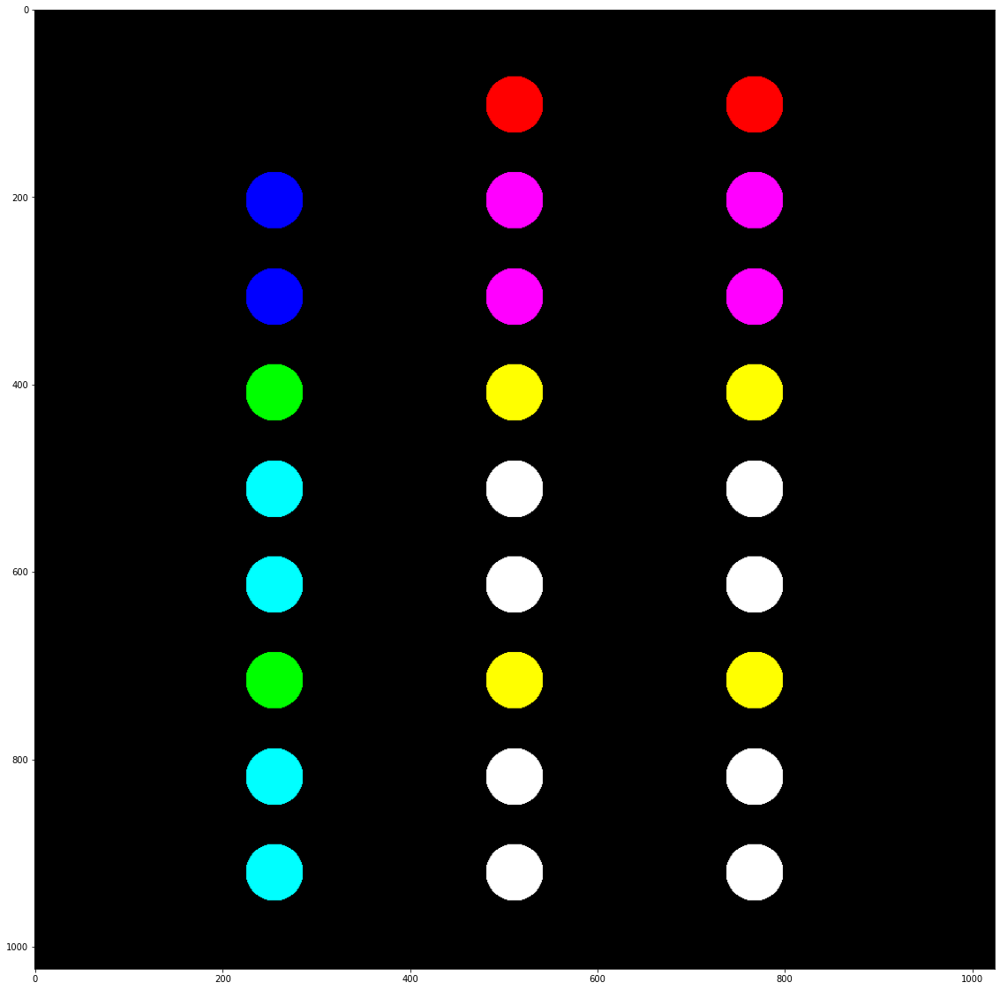

In [110]:
if True:
    print("Cuando se plotea se ve en orden BGR, pero realmente esta en RGB")
    dim=1024

    import numpy as np

    try:
        import cairo
    except ImportError as e:
        raise Exception("En monstruito esta libreria esta instalada en el environment Python 3(ipykernel), en otra libreria como deeplabcrf falla")  # module doesn't exist, deal with it.


    import math
    import matplotlib.pyplot as plt

    
    
    
    nda_3DXX4_data = np.zeros((dim, dim, 4), dtype=np.uint8)
    
    caiImgSur_surface = cairo.ImageSurface.create_for_data(
        nda_3DXX4_data, cairo.FORMAT_ARGB32, dim, dim)
    
    caiCont_context = cairo.Context(caiImgSur_surface)
    # fill with solid white
    caiCont_context.set_source_rgb(0, 0, 0)
    caiCont_context.paint()
    
    if False:
        int_centrox = dim//2#Se asume imagne cuadrada por eso valen lo mismo en x e y
        int_centroy = dim//2#Se asume imagne cuadrada por eso valen lo mismo en x e y

        # draw red circle
        caiCont_context.arc(int_centrox, int_centroy, 400, 0, 2*math.pi)
        caiCont_context.set_line_width(10)
        caiCont_context.set_source_rgb(0, 1, 0)
        caiCont_context.stroke()

    #Posiciones
    arr_1D_posicionesHumboldt=np.linspace(start=0, stop=dim, num=3+2).astype(int)[1:-1]#El primero y el ultimo es para que quede ordenadita la distancia pero no queremos circulos ahi
    arr_1D_posicionesEcuador=np.linspace(start=0, stop=dim, num=9+2).astype(int)[1:-1]#El primero y el ultimo es para que quede ordenadita la distancia pero no queremos circulos ahi
    
    #Colores
    lst_1stDim=([0]*9+[0.5]*9+[1]*9)
    lst_2ndDim=([0]*3+[0.5]*3+[1]*3)*3
    lst_3rdDim=[0,0.5,1]*9
    tpl_3D_merged_list = [(lst_1stDim[i], lst_2ndDim[i], lst_3rdDim[i]) for i in range(0, len(lst_1stDim))]
    
    p=0
    for arr_1D_posicionesHumboldt_i in arr_1D_posicionesHumboldt:
        for arr_1D_posicionesEcuador_i in arr_1D_posicionesEcuador:
            
            caiCont_context.arc(arr_1D_posicionesHumboldt_i, arr_1D_posicionesEcuador_i, 30, 0, 2*math.pi)
            #caiCont_context.set_line_width(10)
            print(tpl_3D_merged_list[p])
            #print(tpl_3D_merged_list[p][0])
            #print(tpl_3D_merged_list[p][1])
            #print(tpl_3D_merged_list[p][2])
            caiCont_context.set_source_rgb(tpl_3D_merged_list[p][0],
                                           tpl_3D_merged_list[p][1],
                                           tpl_3D_merged_list[p][2])
            #caiCont_context.stroke()
            caiCont_context.fill()
            p=p+1


    memView_buf = caiImgSur_surface.get_data()
    nda_3DXX4_array = np.ndarray (shape=(dim,dim,4), dtype=np.uint8, buffer=memView_buf)
    
    nda_3DXX3_array = nda_3DXX4_array[:,:,0:3]
    
    
    nda_3DXX3_arrayRGB = np.zeros(shape=(dim,dim,3))
    nda_3DXX3_arrayRGB[:,:,0] = nda_3DXX3_array[:,:,2]
    nda_3DXX3_arrayRGB[:,:,1] = nda_3DXX3_array[:,:,1]
    nda_3DXX3_arrayRGB[:,:,2] = nda_3DXX3_array[:,:,0]
    
    plt.rcParams["figure.figsize"] = [20, 20]
    plt.imshow(nda_3DXX3_arrayRGB)
    plt.show()
    
    caiImgSur_surface.write_to_png('cairo.png')

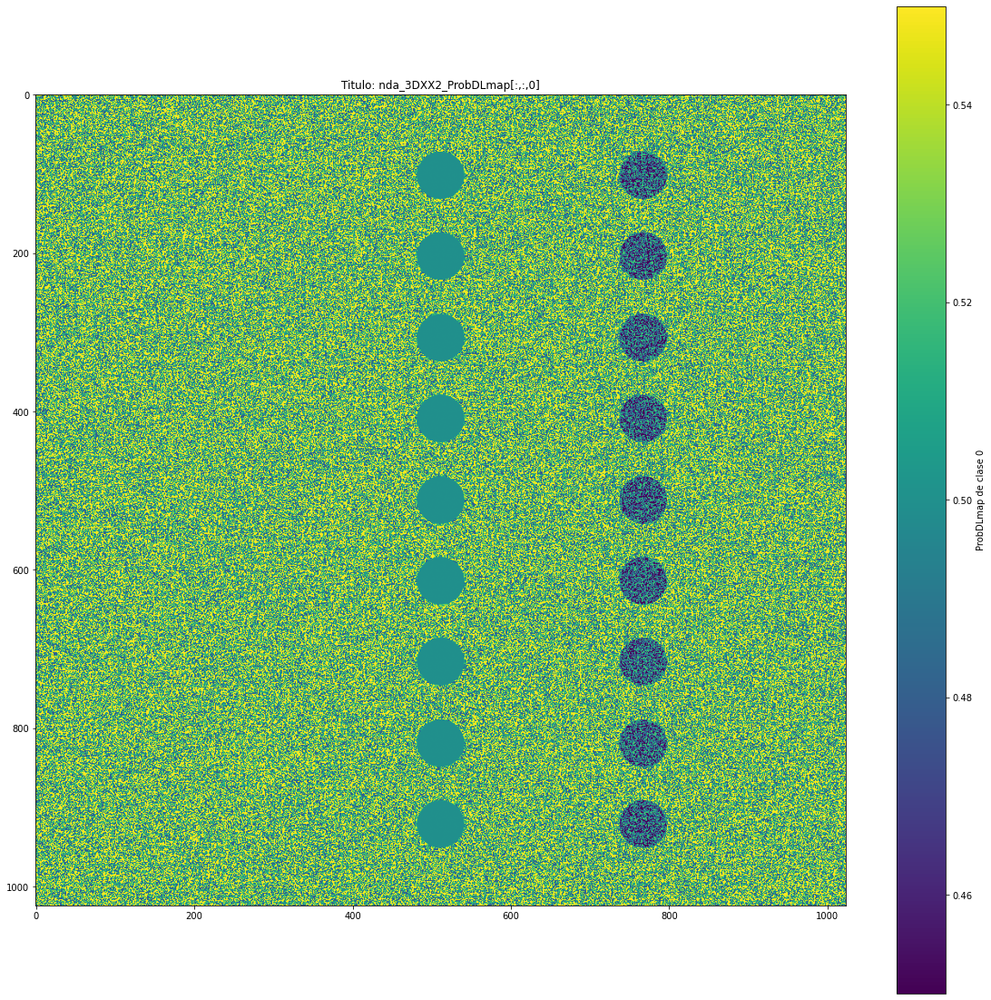

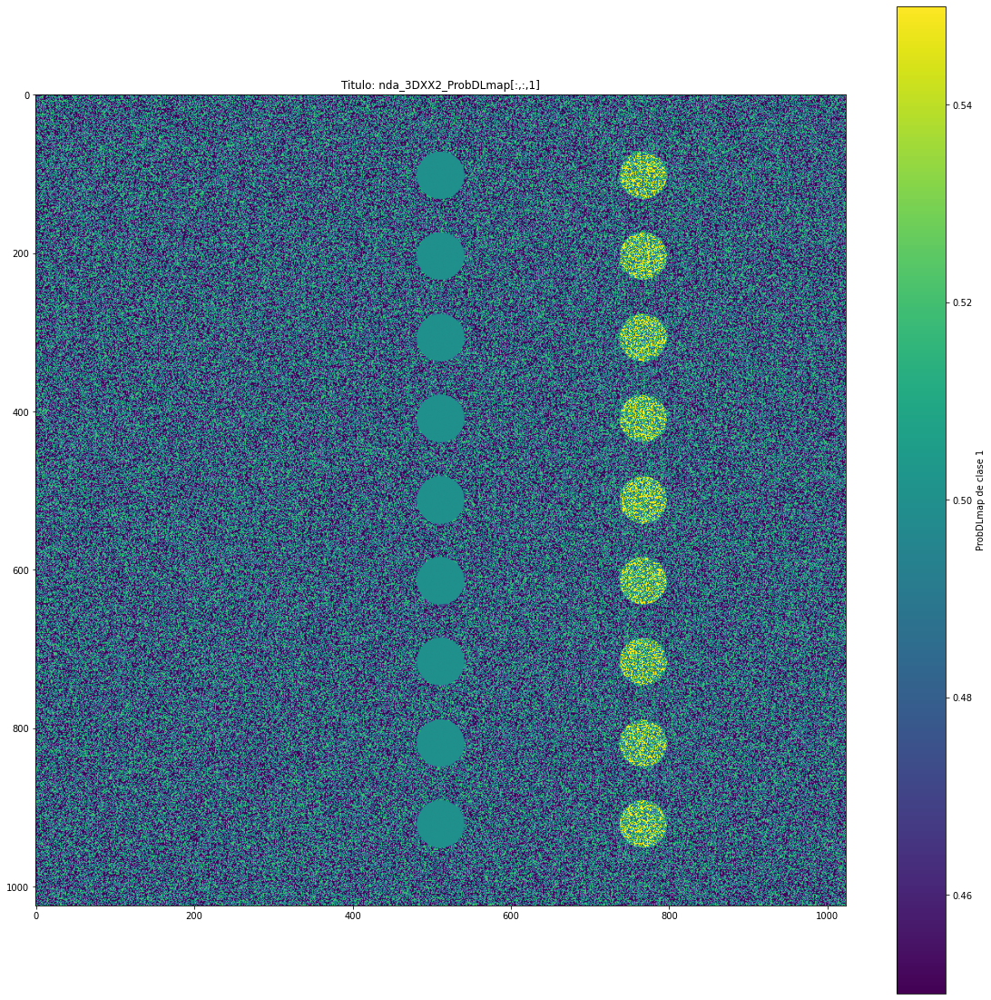

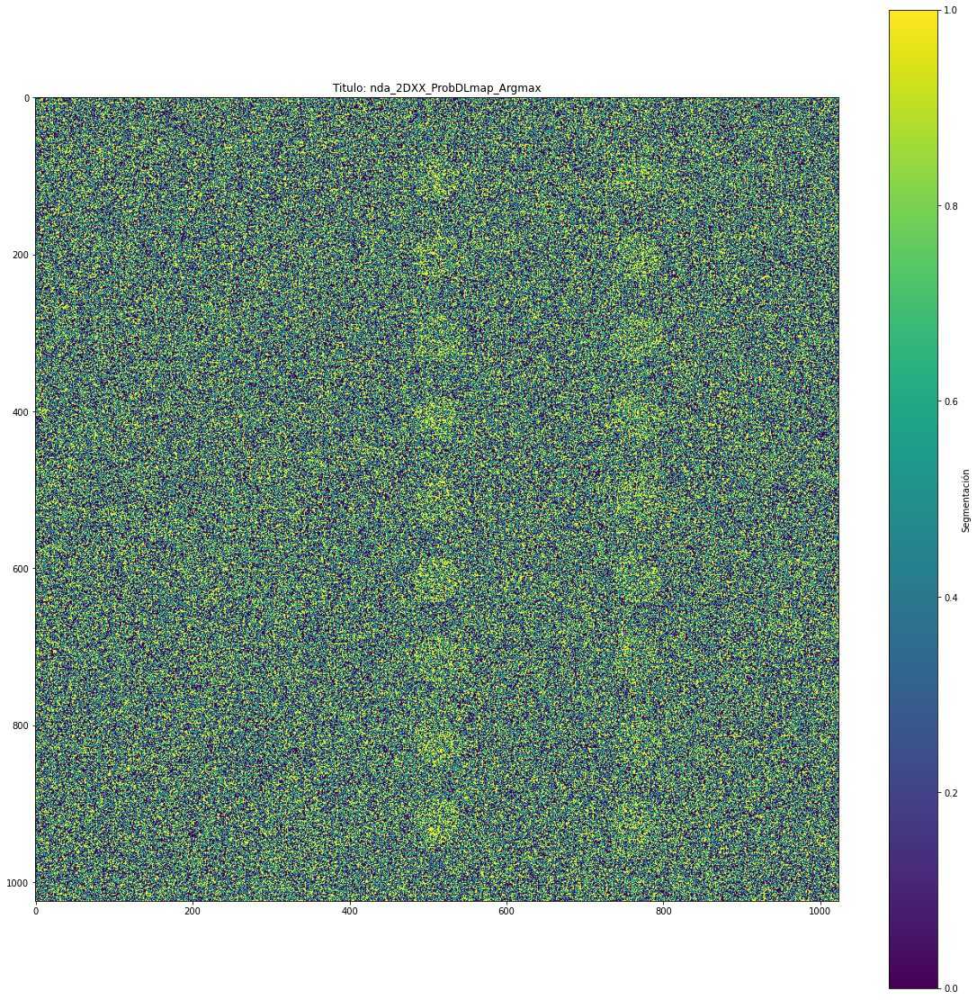

PROB_CRF_MAP
CRF nda_3DXX3_imgRawIn.shape:  (1024, 1024, 3)
nda_3DXX2_probmapIn.shape:  (1024, 1024, 2)
nda_2D2X_unary.shape (2, 1048576)
type(MatrixXf_Q):  <class 'pydensecrf.eigen.MatrixXf'>
nda_3D2XX_Q.shape:  (2, 1024, 1024)
nda_3DXX2_Q.shape:  (1024, 1024, 2)


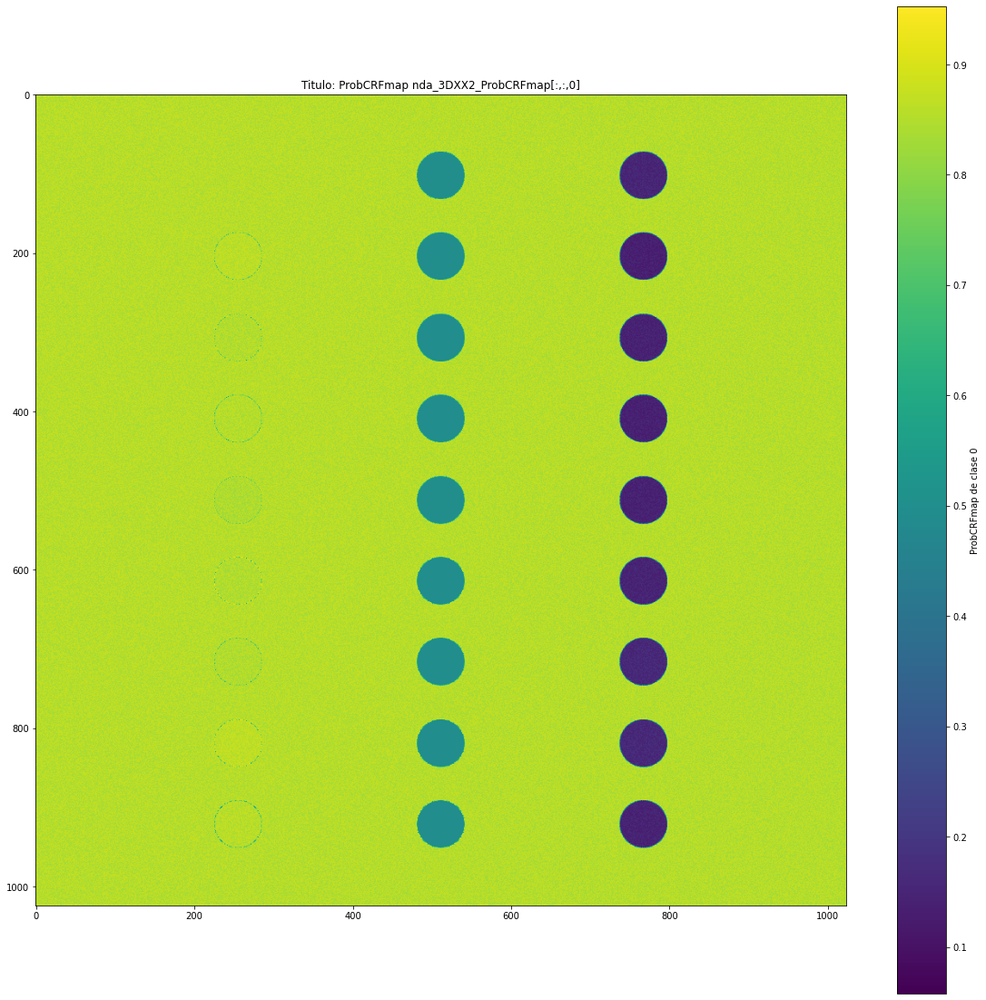

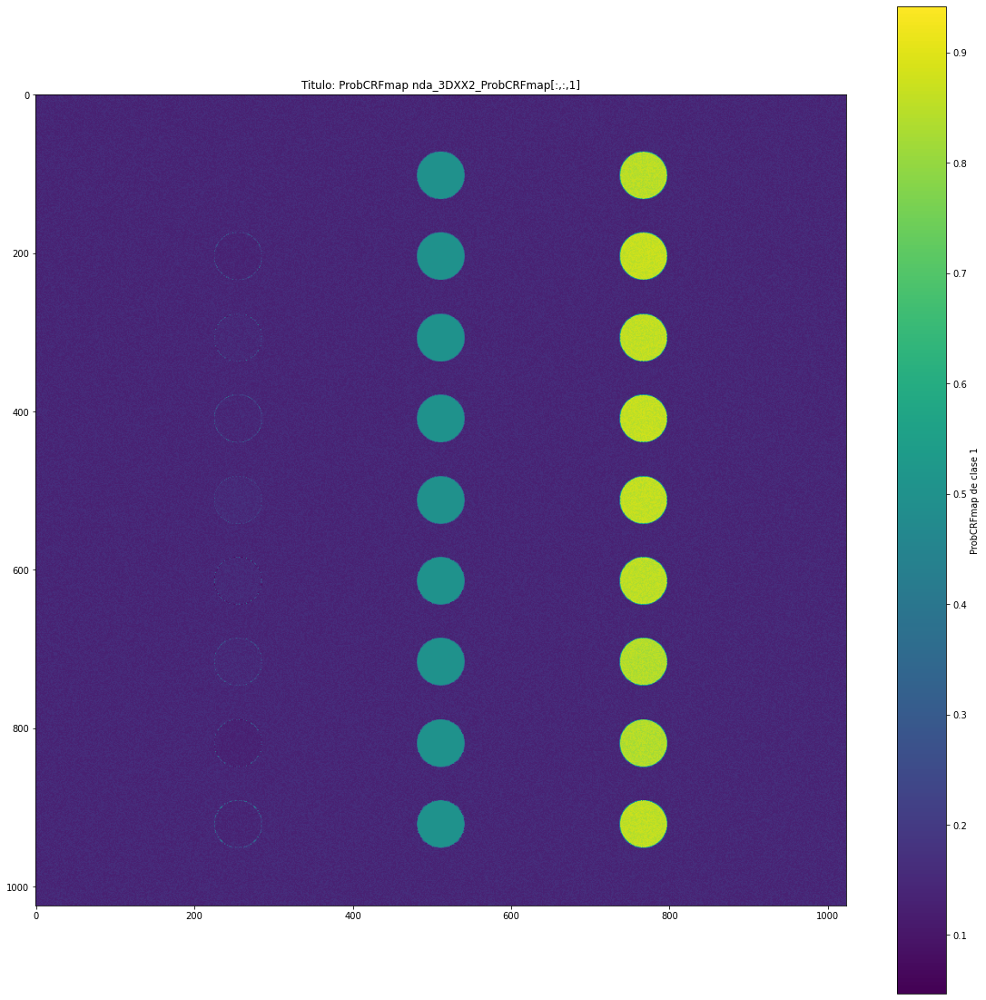

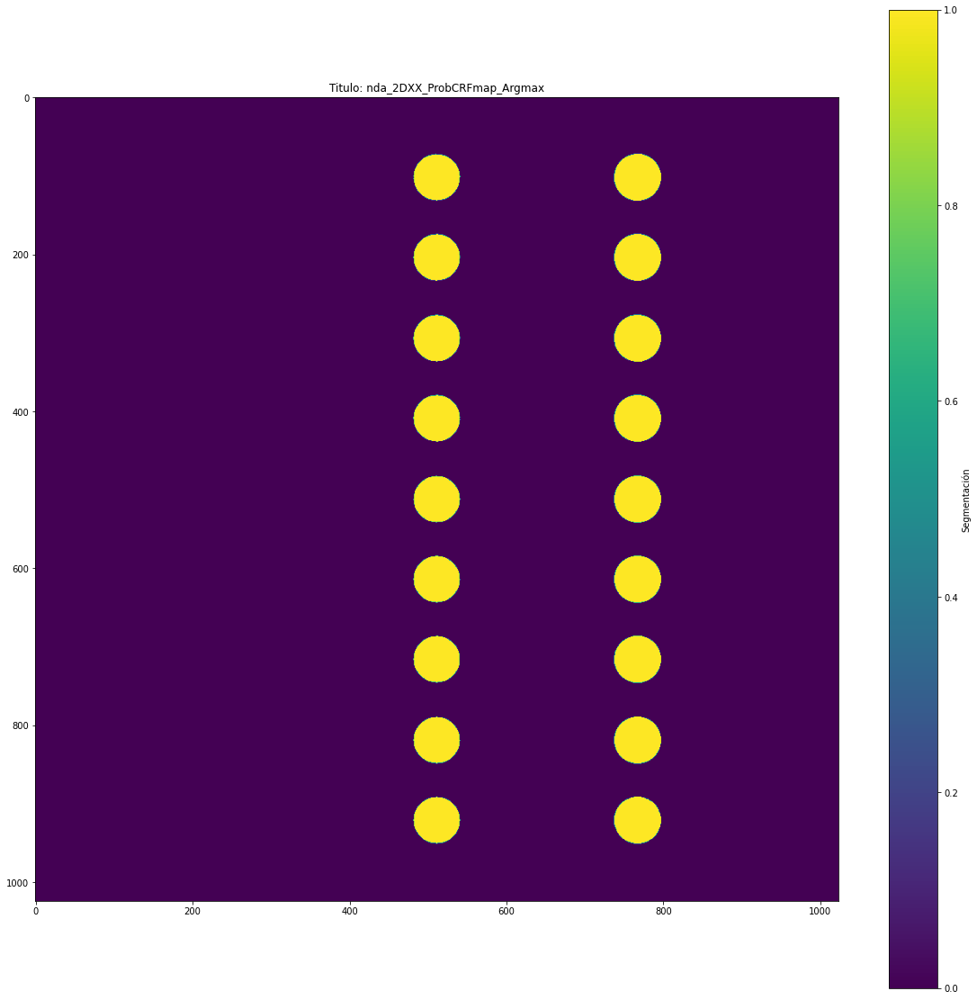

In [134]:
#nda_3DXX2_ProbDLmap = func_probmapArtificialX(nda_3DXX3_labelGIn=nda_3DXX3_array, 
nda_3DXX2_ProbDLmap = func_probmapArtificialX(nda_3DXX3_labelGIn=nda_3DXX3_arrayRGB, 
                                              int_CMaxIn=0.55,
                                              int_IMaxIn=0.52,
                                              int_CFijoIn=0.55,
                                              boo_AzarIn=True, 
                                              int_AzarWeight1In=0.55)
nda_2DXX_ProbDLmap_Argmax = np.argmax(nda_3DXX2_ProbDLmap, axis=2)

plt.imshow(nda_3DXX2_ProbDLmap[:,:,0])
plt.title("Titulo: nda_3DXX2_ProbDLmap[:,:,0]")
plt.colorbar(label="ProbDLmap de clase 0")
plt.show()

plt.imshow(nda_3DXX2_ProbDLmap[:,:,1])
plt.title("Titulo: nda_3DXX2_ProbDLmap[:,:,1]")
plt.colorbar(label="ProbDLmap de clase 1")
plt.show()

plt.imshow(nda_2DXX_ProbDLmap_Argmax)
plt.title("Titulo: nda_2DXX_ProbDLmap_Argmax")
plt.colorbar(label="Segmentación")
plt.show()

import import_ipynb
from A20230112_CRF import class_CRF
import cv2
print("PROB_CRF_MAP")
nda_3DXX3_imRaw = cv2.cvtColor(cv2.imread(r"cairo.png"), cv2.COLOR_BGR2RGB)

int_heightImg=nda_3DXX3_imRaw.shape[0]
int_widthImg=nda_3DXX3_imRaw.shape[1]

nda_3DXX2_ProbCRFmap=class_CRF().func_aplicar_CRF(nda_2DXX_sdXIn=0,
                                          nda_2DXX_sdYIn=0,
                                          nda_3DXX2_probmapIn=nda_3DXX2_ProbDLmap,
                                          tpl_ParametroXYIn=(20000,20000), #(5,5). Si se deja en (1,1), deja mucho ruido de salt and pepper. Con (2,2) (y creo que hacia arriba), se arregla harto
                                          tpl_ParametroRGBIn=(10,10,10),#(10,10,10). Mientras mas grande los pixeles de similar color se pueden volver mas facil de otras clases. Subirle mucho a una dimension significa como que esa dimension no existe?
                                          nda_3DXX3_imgRawIn=nda_3DXX3_imRaw, 
                                          int_inferenceIn=3, 
                                          int_pairwisebilateralCompatIn=5) 
nda_2DXX_ProbCRFmap_Argmax = np.argmax(nda_3DXX2_ProbCRFmap, axis=2)

plt.imshow(nda_3DXX2_ProbCRFmap[:,:,0])
plt.title("Titulo: ProbCRFmap nda_3DXX2_ProbCRFmap[:,:,0]")
plt.colorbar(label="ProbCRFmap de clase 0")
plt.show()

plt.imshow(nda_3DXX2_ProbCRFmap[:,:,1])
plt.title("Titulo: ProbCRFmap nda_3DXX2_ProbCRFmap[:,:,1]")
plt.colorbar(label="ProbCRFmap de clase 1")
plt.show()

plt.imshow(nda_2DXX_ProbCRFmap_Argmax)
plt.title("Titulo: nda_2DXX_ProbCRFmap_Argmax")
plt.colorbar(label="Segmentación")
plt.show()

In [74]:

def func_probmapArtificialX(nda_3DXX3_labelGIn, 
                            int_CMaxIn,
                            int_IMaxIn,
                            int_CFijoIn,
                            boo_AzarIn,
                            int_AzarWeight1In):

    """Si el probmap se consruye desde una Mask de dos clases, el probmap solo tendrá 2 valores"""
    import random
    #nda_2DXX_labelG = cv2.imread(str_archivoejemplIn, cv2.IMREAD_GRAYSCALE)
    #nda_3DXX3_labelG = cv2.cvtColor(cv2.imread(str_archivoejemplIn), cv2.COLOR_BGR2RGB)
    nda_3DXX3_labelG = nda_3DXX3_labelGIn.copy()
    nda_2DXX_labelG = nda_3DXX3_labelG[:,:,0]#Solo nos quedamos con el canal blue que cairo lo tiene en orden BGR
    
    
    if (np.max(nda_2DXX_labelG)==255):
        nda_2DXX_labelG=(nda_2DXX_labelG - 0) / (255 - 0)#Se normaliza para hacer mas facil la asignacion de probabilidades

    #print(np.unique(labelG))

    #listG=listG.tolist()
    lst_lst1DX_listG=nda_2DXX_labelG.tolist()


    #Quizas estan al reves pero como son imagenes cuadradas, da lo mismo
    #int_listGCols=(len(lst_lst1DX_listG))
    #int_listGRows=(len(lst_lst1DX_listG[0]))

    int_labelGRows=nda_2DXX_labelG.shape[0]
    int_labelGCols=nda_2DXX_labelG.shape[1]

    if False:
        int_CMax=probabilidades["int_CC"]#0.7
        int_CMin=probabilidades["int_CI"]#0.3
        int_IMax=probabilidades["int_II"]#0.55
        int_IMin=probabilidades["int_IC"]#0.45

    int_CMax=int_CMaxIn
    #int_CMax=0.55
    #int_CMin=0.45
    int_CMin=1-int_CMax

    int_IMax=int_IMaxIn
    #int_IMax=0.52
    #int_IMin=0.48
    int_IMin=1-int_IMax

    int_CFijo=int_CFijoIn
    #int_CFijo=0.55
    int_IFijo=1-int_CFijo

    #Positivo=bordes, negativo=background
    #int_CC=0.7#Correcto clase correcta
    #int_CI=0.3
    #int_IC=0.45#Incorrecto(porque la mayor probabilidad en este caso la tiene una clase incorrecta) clase correcta 
    #int_II=0.55#incorrecto clase incorrecta 1


    int_AzarWeight1=int_AzarWeight1In
    int_AzarWeight0=1-int_AzarWeight1

    for row in range(0,int_labelGRows):  #Recorre toda la imagen  
        for col in range(0,int_labelGCols):

            int_aux=lst_lst1DX_listG[row][col]

            if(boo_AzarIn==True):
                int_azar=random.choices(population=[0,1],weights=[int_AzarWeight0, int_AzarWeight1],k=1)[0]#weights=[0.45, 0.55] 

                #print(int_aux)#borrarprint
                #print(labelG_Conv[row][col])
                if (int_azar==1):#Correcto. CLasifica "bien" en ambas clases con un 70% de probabilidades de hacerlo correctamente para cada clase
                    #if(lst_lst1DX_listG[row][col]==1):
                    #    lst_lst1DX_listG[row][col]=[0.35, 0.65]
                    #if(lst_lst1DX_listG[row][col]==0):
                    #    lst_lst1DX_listG[row][col]=[0.65, 0.35]
                    lst_lst1DX_listG[row][col]=[int_CMax*(1-int_aux)+int_CMin*(int_aux),#int_aux si es 255 o sea 1, maskara con valor 1=embrion, entonces...se asigna minima probabilidad a fondo que es la clase 0 que esta en el eje 0 y la maxima probabilidad a embrion que es la clase 1 que esta en el eje 1
                                                int_CMax*(int_aux)+int_CMin*(1-int_aux)] #Es caso correcto. el primer termino va entre [int_CMin,int_CMax] y el segundo entre [int_CMin,int_CMax]. Si el pixel es 1 (vaca), la distribucion queda [0.3,0.7]. Tiene dimensiones igual a (alto,ancho,2)

                if (int_azar==0):#Incorrecto. CLasifica "mal" en ambas clases con un 55% de probabilidades de hacerlo incorrectamente para cada clase
                    #if(lst_lst1DX_listG[row][col]==1):
                    #    lst_lst1DX_listG[row][col]=[0.55, 0.45]
                    #if(lst_lst1DX_listG[row][col]==0):
                    #    lst_lst1DX_listG[row][col]=[0.45, 0.55]
                    lst_lst1DX_listG[row][col]=[int_IMax*(int_aux)+int_IMin*(1-int_aux),#Cuando es embrion o sea 1, como esta incorrecto, le da mas probabilidad a la clase fondo
                                                int_IMax*(1-int_aux)+int_IMin*(int_aux)]#Es caso incorrecto. el primer termino va entre [int_IMin,int_IMax] y el segundo entre [int_IMin,int_IMax]. Si el pixel es 1 (vaca), la distribucion queda [0.7,0.3]
            if(boo_AzarIn==False):
                if(int_aux<0.5):#Si es fondo
                    lst_lst1DX_listG[row][col]=[int_CFijo, int_IFijo]
                if(int_aux>=0.5):#Si es fondo
                    lst_lst1DX_listG[row][col]=[int_IFijo, int_CFijo]

    nda_3DXX2_arrProbmap = np.array(lst_lst1DX_listG)

    #print("nda_3DXX2_arrProbmap.shape: ",nda_3DXX2_arrProbmap.shape)
    #print("np.unique(nda_3DXX2_arrProbmap[:,:,0]): ",np.unique(nda_3DXX2_arrProbmap[:,:,0]))
    #print("np.unique(nda_3DXX2_arrProbmap[:,:,1]): ",np.unique(nda_3DXX2_arrProbmap[:,:,1]))
    #print("nda_3DXX2_arrProbmap.shape: ", nda_3DXX2_arrProbmap.shape)
    #print("nda_3DXX2_arrProbmap[:,:,0].shape: ", nda_3DXX2_arrProbmap[:,:,0].shape)
    #print("nda_3DXX2_arrProbmap[:,:,1].shape: ", nda_3DXX2_arrProbmap[:,:,1].shape)


    if False:
        plt.imshow(nda_3DXX2_arrProbmap[:,:,0])
        plt.title("Titulo: func_probmapArtificial nda_3DXX2_arrProbmap[:,:,0]")
        plt.colorbar(label="Probmap de clase 0")
        plt.show()
        print("##########################################")
        plt.imshow(nda_3DXX2_arrProbmap[:,:,1])
        plt.title("Titulo: func_probmapArtificial nda_3DXX2_arrProbmap[:,:,1]")
        plt.colorbar(label="Probmap de clase 1")
        plt.show()
    return(nda_3DXX2_arrProbmap)
    ###Fin func_probmapArtificialX

